<a href="https://colab.research.google.com/github/CodeAjay/CPP/blob/main/Dogs_vs_Cats.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Cat Vs Dog Classification
##Download Dataset

dog=1, cat=0

In [2]:
!wget https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_5340.zip

--2024-02-20 12:32:01--  https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_5340.zip
Resolving download.microsoft.com (download.microsoft.com)... 23.200.152.196, 2600:1413:5000:489::317f, 2600:1413:5000:482::317f
Connecting to download.microsoft.com (download.microsoft.com)|23.200.152.196|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 824887076 (787M) [application/octet-stream]
Saving to: ‘kagglecatsanddogs_5340.zip’

kagglecatsanddogs_5 100%[===================>] 786.67M  80.7MB/s    in 11s     

2024-02-20 12:32:11 (74.5 MB/s) - ‘kagglecatsanddogs_5340.zip’ saved [824887076/824887076]



##Unzip the dataset


In [3]:
!unzip kagglecatsanddogs_5340.zip

Streaming output truncated to the last 5000 lines.
  inflating: PetImages/Dog/5500.jpg  
  inflating: PetImages/Dog/5501.jpg  
  inflating: PetImages/Dog/5502.jpg  
  inflating: PetImages/Dog/5503.jpg  
  inflating: PetImages/Dog/5504.jpg  
  inflating: PetImages/Dog/5505.jpg  
  inflating: PetImages/Dog/5506.jpg  
  inflating: PetImages/Dog/5507.jpg  
  inflating: PetImages/Dog/5508.jpg  
  inflating: PetImages/Dog/5509.jpg  
  inflating: PetImages/Dog/551.jpg   
  inflating: PetImages/Dog/5510.jpg  
  inflating: PetImages/Dog/5511.jpg  
  inflating: PetImages/Dog/5512.jpg  
  inflating: PetImages/Dog/5513.jpg  
  inflating: PetImages/Dog/5514.jpg  
  inflating: PetImages/Dog/5515.jpg  
  inflating: PetImages/Dog/5516.jpg  
  inflating: PetImages/Dog/5517.jpg  
  inflating: PetImages/Dog/5518.jpg  
  inflating: PetImages/Dog/5519.jpg  
  inflating: PetImages/Dog/552.jpg   
  inflating: PetImages/Dog/5520.jpg  
  inflating: PetImages/Dog/5521.jpg  
  inflating: PetImages/Dog/5522.jpg  

# New Section

##Import the Modules


In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
import os
import tqdm
import random
from keras.preprocessing.image import load_img
warnings.filterwarnings('ignore')

## Create Dataframe for input and output


In [5]:
input_path=[]
label=[]

for class_name in os.listdir("PetImages"):
  for path in os.listdir("PetImages/"+class_name):
    if class_name=="Cat":
      label.append(0)
    else:
      label.append(1)
    input_path.append(os.path.join("PetImages",class_name,path))

print(input_path[0],label[0])

PetImages/Dog/3663.jpg 1


In [6]:
df=pd.DataFrame()
df['images']=input_path
df['label']=label
df=df.sample(frac=1).reset_index(drop=True)
df.head()

,images,label
0,PetImages/Dog/4399.jpg,1
1,PetImages/Dog/10392.jpg,1
2,PetImages/Dog/10736.jpg,1
3,PetImages/Cat/5254.jpg,0
4,PetImages/Dog/1872.jpg,1


In [7]:
for i in df['images']:
  if'.jpg' not in i:
    print(i)

PetImages/Dog/Thumbs.db
PetImages/Cat/Thumbs.db


In [8]:
#delete db files


df=df[df['images']!='PetImages/Dog/Thubs.db']
df=df[df['images']!='PetImages/Cat/Thubs.db']
len(df)

25002

In [9]:
import PIL
l=[]
for image in df['images']:

  try:
    img=PIL.Image.open(image)
  except:
    l.append(image)
l

['PetImages/Cat/666.jpg',
 'PetImages/Dog/Thumbs.db',
 'PetImages/Cat/Thumbs.db',
 'PetImages/Dog/11702.jpg']

In [10]:

df=df[df['images']!='PetImages/Dog/Thubs.db']
df=df[df['images']!='PetImages/Cat/Thubs.db']
df=df[df['images']!='PetImages/Cat/666.jpg']
df=df[df['images']!='PetImages/Dog/11702.jpg']
len(df)

25000

In [22]:
#input split

from sklearn.model_selection import train_test_split
train, test=train_test_split(df,test_size=0.2, random_state=42)

In [12]:
test.head()
# train.head()

,images,label
6869,PetImages/Cat/780.jpg,0
24017,PetImages/Cat/1498.jpg,0
9669,PetImages/Cat/7653.jpg,0
13641,PetImages/Cat/6481.jpg,0
14019,PetImages/Cat/10918.jpg,0


##Exploratory Data Analysis

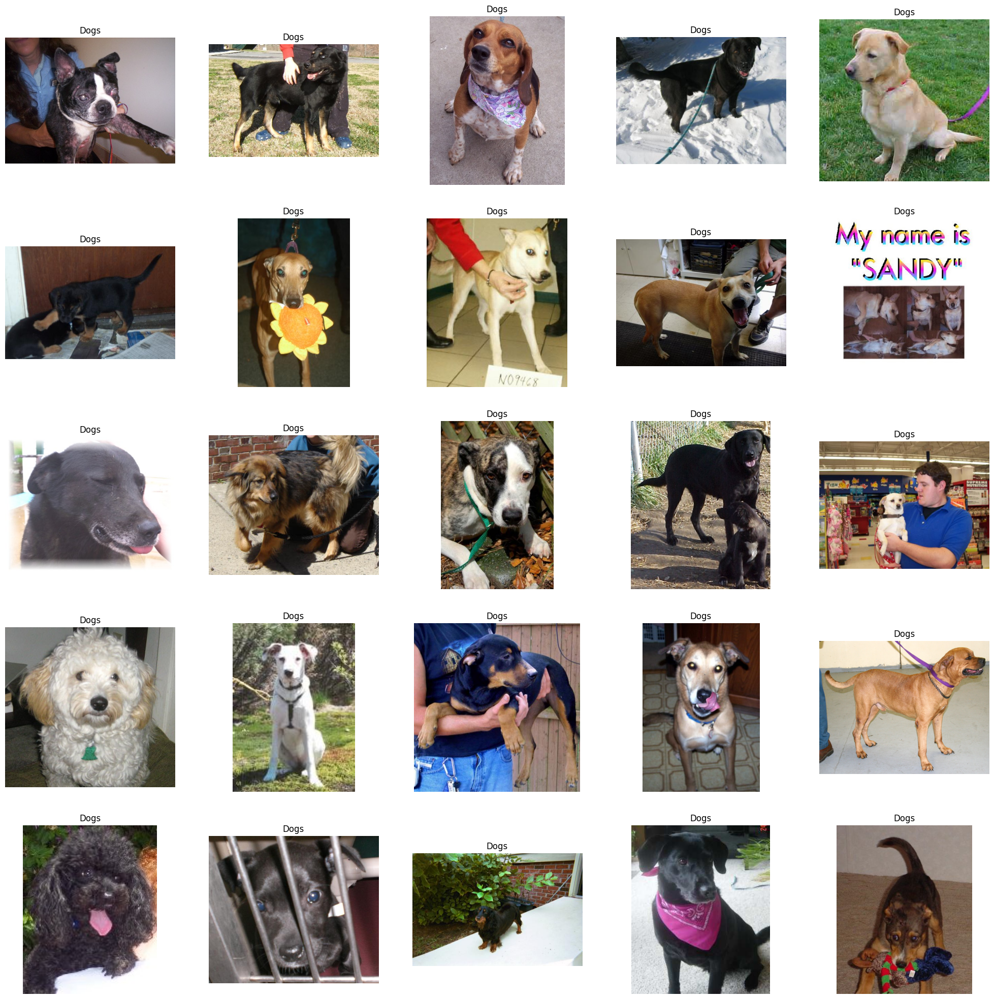

In [13]:
#to display grid of images
plt.figure(figsize=(25,25))
tmp=df[df['label']==1]['images']
start = random.randint(0, len(tmp))
files=tmp[start:start+25]

for index, file in enumerate(files):
  plt.subplot(5,5,index+1)
  img=load_img(file)
  img=np.array(img)
  plt.imshow(img)
  plt.title('Dogs')
  plt.axis('off')

##For showing cats Images


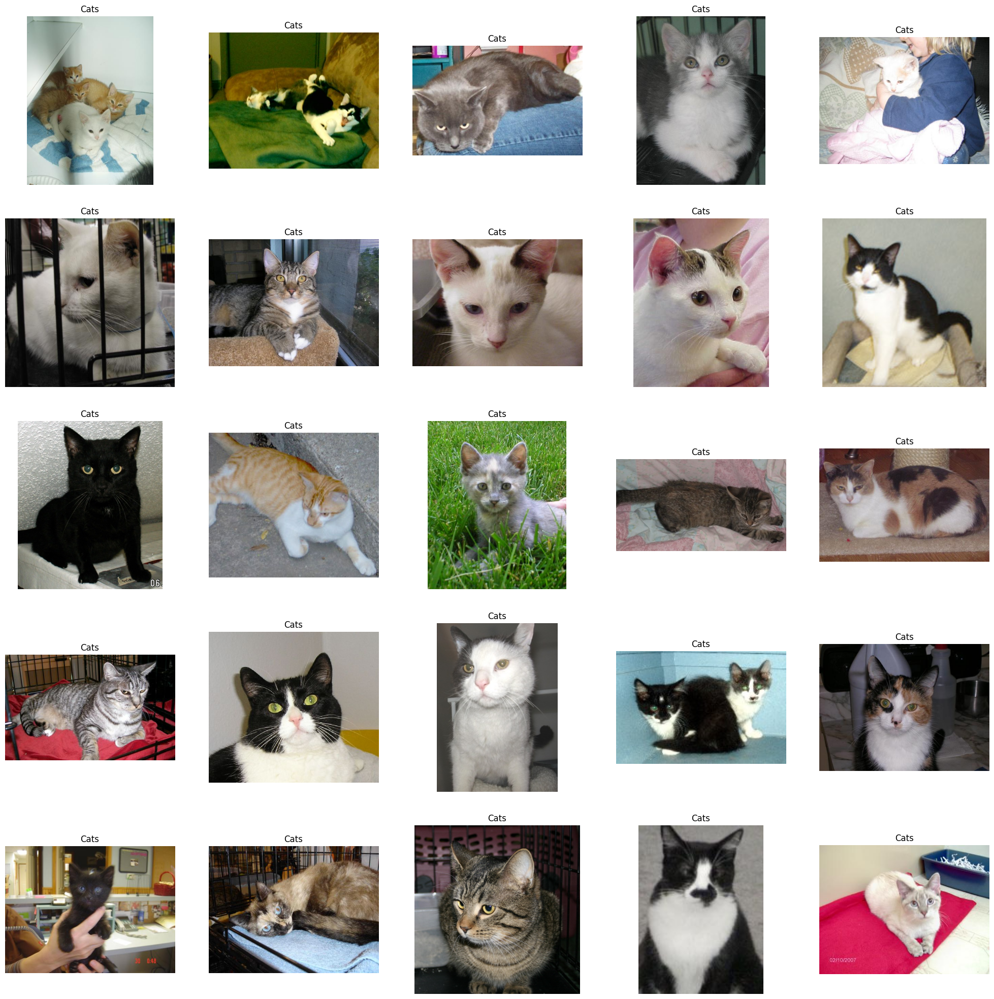

In [14]:
#to display grid of images
plt.figure(figsize=(25,25))
tmp=df[df['label']==0]['images']
start = random.randint(0, len(tmp))
files=tmp[start:start+25]

for index, file in enumerate(files):
  plt.subplot(5,5,index+1)
  img=load_img(file)
  img=np.array(img)
  plt.imshow(img)
  plt.title('Cats')
  plt.axis('off')

##

<Axes: ylabel='count'>

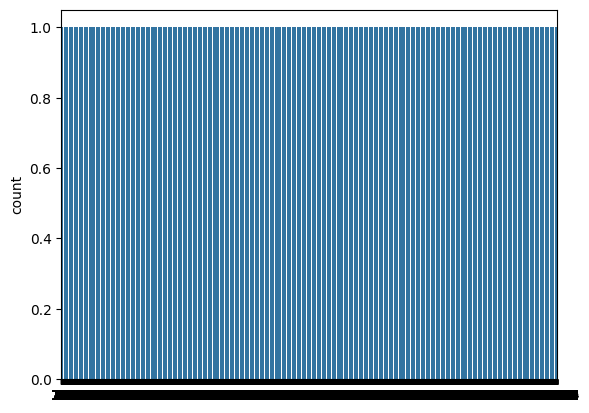

In [15]:
import seaborn as sns
sns.countplot(df['label'])

In [16]:
df['label']=df['label'].astype('str')

In [20]:
df.head()

,images,label
0,PetImages/Dog/4399.jpg,1
1,PetImages/Dog/10392.jpg,1
2,PetImages/Dog/10736.jpg,1
3,PetImages/Cat/5254.jpg,0
4,PetImages/Dog/1872.jpg,1


##Create Data Generator for Images

In [23]:
from keras.preprocessing.image import ImageDataGenerator
train_generator = ImageDataGenerator(
    rescale=1./255, #normalization of images
    rotation_range=40, #augmentation of images to avoid overfitting
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

val_generator =ImageDataGenerator(rescale=1./255)

train_iterator = train_generator.flow_from_dataframe(
    train,
    x_col='images',
    y_col='label',
    target_size=(128,128),
    batch_size=512,
    class_mode='binary'
)

val_iterator = val_generator.flow_from_dataframe(
    test,
    x_col='images',
    y_col='label',
    target_size=(128,128),
    batch_size=512,
    class_mode='binary'
)

Found 19998 validated image filenames belonging to 2 classes.
Found 5000 validated image filenames belonging to 2 classes.


##Model Creation


In [24]:
from keras.src.backend import flatten
from keras import Sequential
from keras.layers import Conv2D, MaxPool2D, Flatten, Dense


model = Sequential([
    Conv2D(16,(3,3),activation='relu', input_shape=(128,128,3)),
    MaxPool2D((2,2)),
    Conv2D(32,(3,3),activation='relu'),
    MaxPool2D((2,2)),
    Conv2D(32,(3,3),activation='relu'),
    MaxPool2D((2,2)),
    Flatten(),
    Dense(512,activation='relu'),
    Dense(1,activation='sigmoid')
])



In [25]:
model.compile(optimizer='adam', loss='binary_crossentropy', metrics='accuracy')
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 126, 126, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2  (None, 63, 63, 16)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 61, 61, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 30, 30, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 28, 28, 32)        9248      
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 14, 14, 32)        0

##Model Training


In [26]:
history = model.fit(train_iterator, epochs=15, validation_data=val_iterator)

Epoch 1/15
40/40 [==============================] - 116s 3s/step - loss: 0.6819 - accuracy: 0.5627 - val_loss: 0.6434 - val_accuracy: 0.6232
Epoch 2/15
40/40 [==============================] - 111s 3s/step - loss: 0.6035 - accuracy: 0.6749 - val_loss: 0.5710 - val_accuracy: 0.6968
Epoch 3/15
40/40 [==============================] - 109s 3s/step - loss: 0.5610 - accuracy: 0.7133 - val_loss: 0.5609 - val_accuracy: 0.7104
Epoch 4/15
40/40 [==============================] - 113s 3s/step - loss: 0.5307 - accuracy: 0.7364 - val_loss: 0.5384 - val_accuracy: 0.7262
Epoch 5/15
40/40 [==============================] - 109s 3s/step - loss: 0.5218 - accuracy: 0.7397 - val_loss: 0.4944 - val_accuracy: 0.7552
Epoch 6/15
40/40 [==============================] - 110s 3s/step - loss: 0.4870 - accuracy: 0.7650 - val_loss: 0.5190 - val_accuracy: 0.7458
Epoch 7/15
40/40 [==============================] - 108s 3s/step - loss: 0.4676 - accuracy: 0.7772 - val_loss: 0.4652 - val_accuracy: 0.7820
Epoch 8/15
40

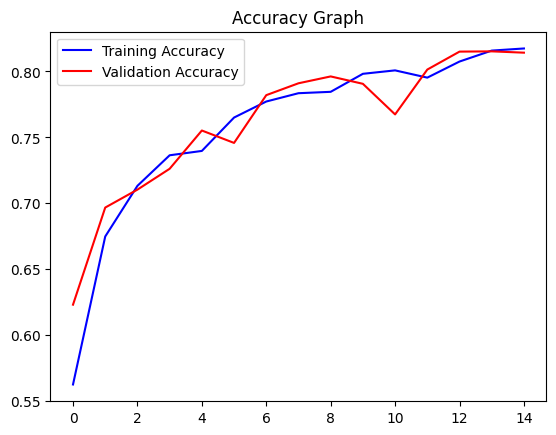

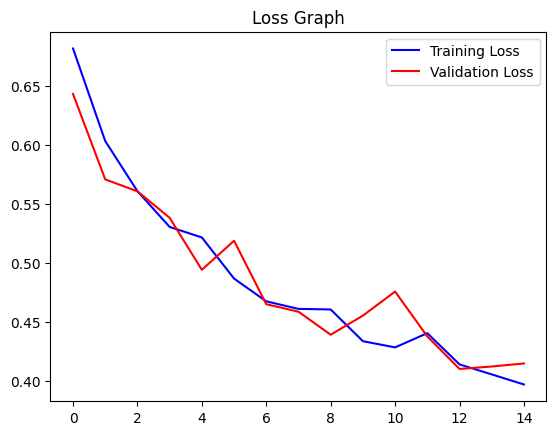

In [27]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
epochs = range(len(acc))

plt.plot(epochs, acc, 'b', label='Training Accuracy')
plt.plot(epochs, val_acc, 'r', label='Validation Accuracy')
plt.title('Accuracy Graph')
plt.legend()
plt.figure()

loss = history.history['loss']
val_loss=history.history['val_loss']

plt.plot(epochs, loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Loss Graph')
plt.legend()
plt.show()

In [28]:
model.save('test.h5')

1/1 [==============================] - 0s 96ms/step


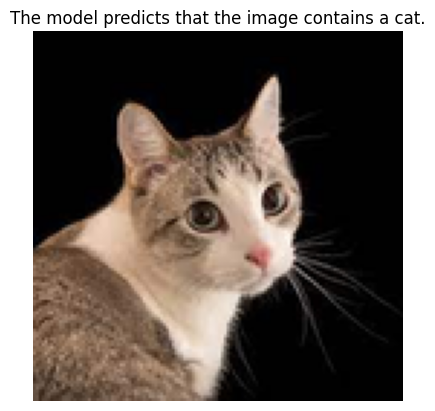

In [49]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import img_to_array
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

# Load your pre-trained model
model = tf.keras.models.load_model('test.h5')

# Load and preprocess your custom image
custom_image_path = 'Test/11.jpeg'

# Load the image
image = Image.open(custom_image_path)

# Resize the image while preserving aspect ratio
target_size = (128, 128)
image.thumbnail(target_size, Image.ANTIALIAS)
background = Image.new('RGB', target_size, (255, 255, 255))
background.paste(
    image, ((target_size[0] - image.size[0]) // 2, (target_size[1] - image.size[1]) // 2)
)

# Convert the resized image to an array
custom_image = img_to_array(background) / 255.0  # Normalize pixel values to [0, 1]
custom_image = np.expand_dims(custom_image, axis=0)  # Add batch dimension

# Make predictions
predictions = model.predict(custom_image)

# Post-process predictions (e.g., get the class with the highest probability)
predicted_class = np.argmax(predictions)

# You can map the predicted class index to class labels if you have a class mapping
class_labels = ['cat', 'dog']
predicted_label = class_labels[predicted_class]

# Display the image
plt.imshow(background)
plt.axis('off')
plt.title(f'The model predicts that the image contains a {predicted_label}.')
plt.show()
